In [2]:
import torch
import torch.nn.functional as F
import numpy as np
import json
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import skimage.transform
import argparse
from scipy.misc import imread, imresize
from PIL import Image
import os
import random


import torchvision.datasets as dset
import torchvision.transforms as transforms
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px


import torch
import torchvision
import torchvision.transforms as transforms
import torch.nn as nn
import torchvision.models as models
from torch.autograd import Variable
import torch.optim as optim
import torch.nn.functional as F

from skimage.transform import resize

from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import roc_auc_score
from sklearn.metrics import accuracy_score

from efficientnet_pytorch import EfficientNet

import nltk
from collections import Counter
from collections import OrderedDict

import json
from pycocotools.coco import COCO
import pickle

import re
from PIL import Image 

import time
import torch.backends.cudnn as cudnn
import torch.optim
import torch.utils.data
import torchvision.transforms as transforms
from torch import nn
from torch.nn.utils.rnn import pack_padded_sequence
from nltk.translate.bleu_score import corpus_bleu


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [3]:
def build_vocab(annon_file,min_threshold,load=True):
    if (load):
        with open('./word2idx', 'rb') as f:
            word2idx=pickle.load(f)
        with open('./idx2word', 'rb') as f:
            idx2word=pickle.load(f)
                
    else:
        word2idx={}
        idx2word={}
        idx=0

        # Adding Start,End and Unkown Token
        word='<start>'
        word2idx[word]=idx
        idx2word[idx]=word
        idx+=1

        word='<end>'
        word2idx[word]=idx
        idx2word[idx]=word
        idx+=1

        word='<unknown>'
        word2idx[word]=idx
        idx2word[idx]=word
        idx+=1
        
        word='<pad>'
        word2idx[word]=idx
        idx2word[idx]=word
        idx+=1



        coco=COCO(annon_file)
        keys=coco.anns.keys()
        counter=Counter()
        for i,key in enumerate(keys):
            caption=coco.anns[key]['caption']
            tokens=nltk.tokenize.word_tokenize(caption.lower())
            counter.update(tokens)

        words = [word for word, count in counter.items() if count >= min_threshold]
        for word in words:
            if word not in word2idx:
                word2idx[word]=idx
                idx2word[idx]=word
                idx+=1
        
        with open('./word2idx', 'wb') as f:
            pickle.dump(word2idx, f)

        with open('./idx2word', 'wb') as f:
            pickle.dump(idx2word, f)

    return word2idx,idx2word


anon_file_train='/home/valkyrie/data/2014/annotations/captions_train2014.json'
anon_file_val='/home/valkyrie/data/2014/annotations/captions_val2014.json'
word2idx,idx2word=build_vocab(anon_file_train,5,load=True)

In [15]:
class Encoder(nn.Module):
    
    def __init__(self,base_model,fine_tune=False):
        super(Encoder, self).__init__()
        
        self.base_model = base_model

        if (fine_tune==False):
            for param in self.base_model.parameters():
                param.requires_grad = False
        
        self.adaptive_pool = nn.AdaptiveAvgPool2d((14,14))
        
    def forward(self,images):
        feat = self.base_model.extract_features(images)  
        out = self.adaptive_pool(feat)  
        out = out.permute(0, 2, 3, 1)
        return out
    

    
    
class Attention(nn.Module):
    """
    Attention Network.
    """

    def __init__(self, encoder_dim, decoder_dim, attention_dim):

        super(Attention, self).__init__()
        self.encoder_att = nn.Linear(encoder_dim, attention_dim)  
        self.decoder_att = nn.Linear(decoder_dim, attention_dim)  
        self.full_att = nn.Linear(attention_dim, 1)  
        self.relu = nn.ReLU()
        self.softmax = nn.Softmax(dim=1) 

    def forward(self, encoder_out, decoder_hidden):
        
        att1 = self.encoder_att(encoder_out)  # (batch_size, num_pixels, attention_dim)
        att2 = self.decoder_att(decoder_hidden)  # (batch_size, attention_dim)
        att = self.full_att(self.relu(att1 + att2.unsqueeze(1))).squeeze(2)
        alpha = self.softmax(att)  
        attention_weighted_encoding = (encoder_out * alpha.unsqueeze(2)).sum(dim=1) 

        return attention_weighted_encoding, alpha


class DecoderWithAttention(nn.Module):
    """
    Decoder which uses Attention Network
    """
    def __init__(self, attention_dim, embed_dim, decoder_dim, vocab_size, encoder_dim=1280, dropout=0.5):
        
        super(DecoderWithAttention, self).__init__()
        self.encoder_dim = encoder_dim
        self.attention_dim = attention_dim
        self.embed_dim = embed_dim
        self.decoder_dim = decoder_dim
        self.vocab_size = vocab_size
        self.dropout = dropout
        self.attention = Attention(encoder_dim, decoder_dim, attention_dim)  # attention network

        
        self.embedding = nn.Embedding(vocab_size, embed_dim)  # embedding layer
        self.dropout = nn.Dropout(p=self.dropout)
        self.decode_step = nn.LSTMCell(embed_dim + encoder_dim, decoder_dim, bias=True)  # decoding LSTMCell
        self.init_h = nn.Linear(encoder_dim, decoder_dim)  
        self.init_c = nn.Linear(encoder_dim, decoder_dim)  
        self.f_beta = nn.Linear(decoder_dim, encoder_dim)  
        self.sigmoid = nn.Sigmoid()
        
        # Output Layer
        self.fc = nn.Linear(decoder_dim, vocab_size)  
        self.init_weights()  

    def init_weights(self):
        self.embedding.weight.data.uniform_(-0.1, 0.1)
        self.fc.bias.data.fill_(0)
        self.fc.weight.data.uniform_(-0.1, 0.1)    

    def init_hidden_state(self, encoder_out):
        mean_encoder_out = encoder_out.mean(dim=1)
        h = self.init_h(mean_encoder_out) 
        c = self.init_c(mean_encoder_out)
        return h, c

    def forward(self, encoder_out, encoded_captions, caption_lengths):
        batch_size = encoder_out.size(0)
        encoder_dim = encoder_out.size(-1)
        vocab_size = self.vocab_size

        # Flatten image
        encoder_out = encoder_out.view(batch_size, -1, encoder_dim)  
        num_pixels = encoder_out.size(1)

        caption_lengths, sort_ind = caption_lengths.sort(dim=0, descending=True)
        encoder_out = encoder_out[sort_ind]
        encoded_captions = encoded_captions[sort_ind]

        # Embeddings
        embeddings = self.embedding(encoded_captions) 

        # Initial Cell and Hidden state
        h, c = self.init_hidden_state(encoder_out)  

        decode_lengths = (caption_lengths - 1).tolist()
        
        
        # Output Tensors
        predictions = torch.zeros(batch_size, max(decode_lengths), vocab_size).to(device)
        alphas = torch.zeros(batch_size, max(decode_lengths), num_pixels).to(device)

        """
        Main Decode Step. Output used from the previous timestep and the attention weighted encoding is used.
        """
        for size in range(max(decode_lengths)):
            batch_size_t = sum([l > size for l in decode_lengths])
            attention_weighted_encoding, alpha = self.attention(encoder_out[:batch_size_t],
                                                                h[:batch_size_t])
            # LSTM gate
            gate = self.sigmoid(self.f_beta(h[:batch_size_t]))  
            attention_weighted_encoding = gate * attention_weighted_encoding
            h, c = self.decode_step(
                torch.cat([embeddings[:batch_size_t, size, :], attention_weighted_encoding], dim=1),
                (h[:batch_size_t], c[:batch_size_t]))
            preds = self.fc(self.dropout(h)) 
            predictions[:batch_size_t, size, :] = preds
            alphas[:batch_size_t, size, :] = alpha

        return predictions, encoded_captions, decode_lengths, alphas, sort_ind

In [16]:
def caption(filename,encoder, decoder, image_path, word_map, beam_size=3):
    k = beam_size
    vocab_size = len(word_map)

    # Read image and process
    img = imread(image_path)
    if len(img.shape) == 2:
        img = img[:, :, np.newaxis]
        img = np.concatenate([img, img, img], axis=2)
    
    plt.imshow(img)
    plt.savefig(filename)
    plt.show()
    
    
    img = imresize(img, (256, 256))
    img = img.transpose(2, 0, 1)
    img = img / 255.
    img = torch.FloatTensor(img).to(device)
    normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                     std=[0.229, 0.224, 0.225])
    transform = transforms.Compose([normalize])
    image = transform(img) 

    # Encode
    image = image.unsqueeze(0)  
    encoder_out = encoder(image)  
    enc_image_size = encoder_out.size(1)
    encoder_dim = encoder_out.size(3)

    
    # Flatten encoding
    encoder_out = encoder_out.view(1, -1, encoder_dim)  # (1, num_pixels, encoder_dim)
    num_pixels = encoder_out.size(1)
#     print (num_pixels)
    
    encoder_out = encoder_out.expand(k, num_pixels, encoder_dim)  

    k_prev_words = torch.LongTensor([[word_map['<start>']]] * k).to(device) 

    seqs = k_prev_words  # (k, 1)
    top_k_scores = torch.zeros(k, 1).to(device)
    
#     print (top_k_scores)

    seqs_alpha = torch.ones(k, 1, enc_image_size, enc_image_size).to(device)  

    complete_seqs = list()
    complete_seqs_alpha = list()
    complete_seqs_scores = list()

    #Decoding
    step = 1
    h, c = decoder.init_hidden_state(encoder_out)

    while True:

        embeddings = decoder.embedding(k_prev_words).squeeze(1)  # (s, embed_dim)

        awe, alpha = decoder.attention(encoder_out, h)  # (s, encoder_dim), (s, num_pixels)

        alpha = alpha.view(-1, enc_image_size, enc_image_size)  # (s, enc_image_size, enc_image_size)

        gate = decoder.sigmoid(decoder.f_beta(h))  # gating scalar, (s, encoder_dim)
        awe = gate * awe

        h, c = decoder.decode_step(torch.cat([embeddings, awe], dim=1), (h, c))  # (s, decoder_dim)

        scores = decoder.fc(h)  # (s, vocab_size)
        scores = F.log_softmax(scores, dim=1)

        # Add
        scores = top_k_scores.expand_as(scores) + scores  # (s, vocab_size)

        if step == 1:
            top_k_scores, top_k_words = scores[0].topk(k, 0, True, True)  # (s)
        else:
            # Unroll and find top scores, and their unrolled indices
            top_k_scores, top_k_words = scores.view(-1).topk(k, 0, True, True)  # (s)

        # Convert unrolled indices to actual indices of scores
        prev_word_inds = top_k_words / vocab_size  # (s)
        next_word_inds = top_k_words % vocab_size  # (s)

        # Add new words to sequences, alphas
        seqs = torch.cat([seqs[prev_word_inds], next_word_inds.unsqueeze(1)], dim=1)  # (s, step+1)
        seqs_alpha = torch.cat([seqs_alpha[prev_word_inds], alpha[prev_word_inds].unsqueeze(1)],
                               dim=1)  
        
        
        incomplete_inds = [ind for ind, next_word in enumerate(next_word_inds) if
                           next_word != word_map['<end>']]
        complete_inds = list(set(range(len(next_word_inds))) - set(incomplete_inds))

        if len(complete_inds) > 0:
            complete_seqs.extend(seqs[complete_inds].tolist())
            complete_seqs_alpha.extend(seqs_alpha[complete_inds].tolist())
            complete_seqs_scores.extend(top_k_scores[complete_inds])
        k -= len(complete_inds)  # reduce beam length accordingly

        if k == 0:
            break
        seqs = seqs[incomplete_inds]
        seqs_alpha = seqs_alpha[incomplete_inds]
        h = h[prev_word_inds[incomplete_inds]]
        c = c[prev_word_inds[incomplete_inds]]
        encoder_out = encoder_out[prev_word_inds[incomplete_inds]]
        top_k_scores = top_k_scores[incomplete_inds].unsqueeze(1)
        k_prev_words = next_word_inds[incomplete_inds].unsqueeze(1)

        
        if step > 50:
            break
        step += 1

    i = complete_seqs_scores.index(max(complete_seqs_scores))
    seq = complete_seqs[i]
    alphas = complete_seqs_alpha[i]

    return seq, alphas


def atten(image_path, seq, alphas, rev_word_map, filename,smooth=True):
    
    
    image = Image.open(image_path)
    image = image.resize([14 * 24, 14 * 24], Image.LANCZOS)

    words = [rev_word_map[ind] for ind in seq]

    for t in range(len(words)):
        if t > 50:
            break
        plt.subplot(np.ceil(len(words) / 5.), 5, t + 1)

        plt.text(0, 1, '%s' % (words[t]), color='black', backgroundcolor='white', fontsize=12)
        plt.imshow(image)
        current_alpha = alphas[t, :]
        if smooth:
            alpha = skimage.transform.pyramid_expand(current_alpha.numpy(), upscale=24, sigma=8)
        else:
            alpha = skimage.transform.resize(current_alpha.numpy(), [14 * 24, 14 * 24])
        if t == 0:
            plt.imshow(alpha, alpha=0)
        else:
            plt.imshow(alpha, alpha=0.8)
        plt.set_cmap(cm.Greys_r)
        plt.axis('off')
    
    plt.savefig(filename)
    plt.show()

In [17]:
# Model parameters
emb_dim = 512  # Word Embedings
attention_dim = 512  # Encoder
decoder_dim = 512  # Decoder
dropout = 0.5
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  

In [18]:
decoder = DecoderWithAttention(attention_dim=attention_dim,
                                       embed_dim=emb_dim,
                                       decoder_dim=decoder_dim,
                                       vocab_size=len(word2idx),
                                       dropout=dropout)
model = EfficientNet.from_pretrained('efficientnet-b1')
encoder=Encoder(model)


Loaded pretrained weights for efficientnet-b1


In [19]:
decoder_weights='./decoder_epoch5_best.pth'
encoder_weights='./encoder_epoch5_best.pth'
# decoder_weights='./checkpoints/decoder_epoch_3_best_b3.pth'
# encoder_weights='./checkpoints/encoder_epoch_3_best_b3.pth'



decoder.load_state_dict(torch.load(decoder_weights))
encoder.load_state_dict(torch.load(encoder_weights))


encoder = encoder.to(device)
decoder=decoder.to(device)

decoder.eval()
encoder.eval()

Encoder(
  (base_model): EfficientNet(
    (_conv_stem): Conv2dStaticSamePadding(
      3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False
      (static_padding): ZeroPad2d(padding=(0, 1, 0, 1), value=0.0)
    )
    (_bn0): BatchNorm2d(32, eps=0.001, momentum=0.010000000000000009, affine=True, track_running_stats=True)
    (_blocks): ModuleList(
      (0): MBConvBlock(
        (_depthwise_conv): Conv2dStaticSamePadding(
          32, 32, kernel_size=(3, 3), stride=[1, 1], groups=32, bias=False
          (static_padding): ZeroPad2d(padding=(1, 1, 1, 1), value=0.0)
        )
        (_bn1): BatchNorm2d(32, eps=0.001, momentum=0.010000000000000009, affine=True, track_running_stats=True)
        (_se_reduce): Conv2dStaticSamePadding(
          32, 8, kernel_size=(1, 1), stride=(1, 1)
          (static_padding): Identity()
        )
        (_se_expand): Conv2dStaticSamePadding(
          8, 32, kernel_size=(1, 1), stride=(1, 1)
          (static_padding): Identity()
        )
        (_p

In [20]:
images=os.listdir('/home/valkyrie/data/2014/test2014/')
# random.choice(os.listdir())

In [23]:
num_images_test=50
img_paths=[]
for i in range(num_images_test):
    img_path='/home/valkyrie/data/2014/test2014/'+random.choice(images)
    img_paths.append(img_path)

In [24]:
img_paths

['/home/valkyrie/data/2014/test2014/COCO_test2014_000000093238.jpg',
 '/home/valkyrie/data/2014/test2014/COCO_test2014_000000231297.jpg',
 '/home/valkyrie/data/2014/test2014/COCO_test2014_000000478836.jpg',
 '/home/valkyrie/data/2014/test2014/COCO_test2014_000000465358.jpg',
 '/home/valkyrie/data/2014/test2014/COCO_test2014_000000001047.jpg',
 '/home/valkyrie/data/2014/test2014/COCO_test2014_000000125489.jpg',
 '/home/valkyrie/data/2014/test2014/COCO_test2014_000000203288.jpg',
 '/home/valkyrie/data/2014/test2014/COCO_test2014_000000221584.jpg',
 '/home/valkyrie/data/2014/test2014/COCO_test2014_000000439216.jpg',
 '/home/valkyrie/data/2014/test2014/COCO_test2014_000000045504.jpg',
 '/home/valkyrie/data/2014/test2014/COCO_test2014_000000304896.jpg',
 '/home/valkyrie/data/2014/test2014/COCO_test2014_000000449341.jpg',
 '/home/valkyrie/data/2014/test2014/COCO_test2014_000000335715.jpg',
 '/home/valkyrie/data/2014/test2014/COCO_test2014_000000245418.jpg',
 '/home/valkyrie/data/2014/test201

/anaconda/envs/py37_pytorch/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  


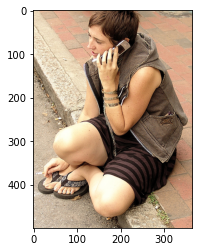

/anaconda/envs/py37_pytorch/lib/python3.7/site-packages/ipykernel_launcher.py:16: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
  app.launch_new_instance()


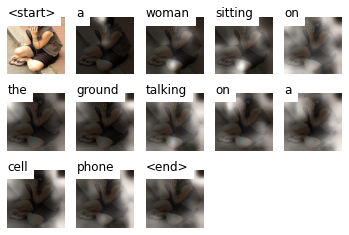

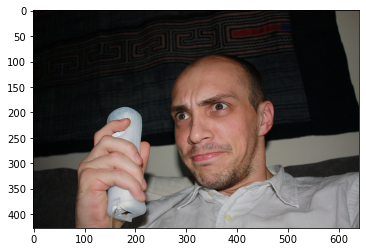

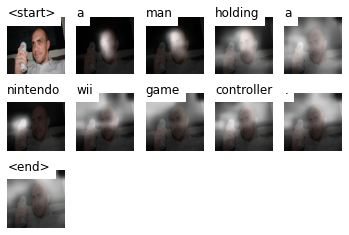

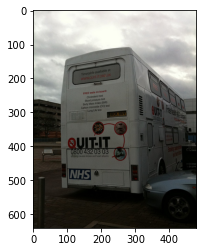

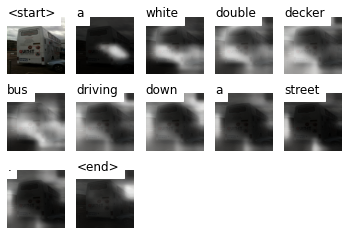

...

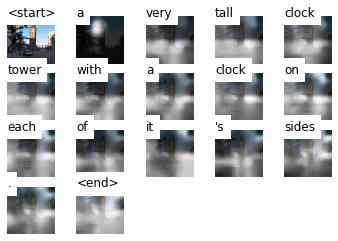

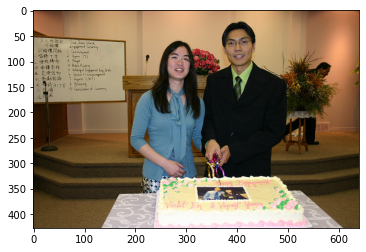

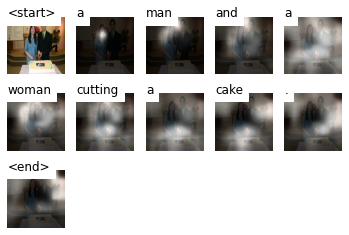

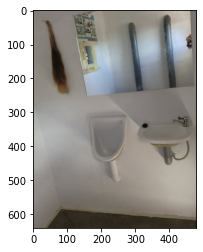

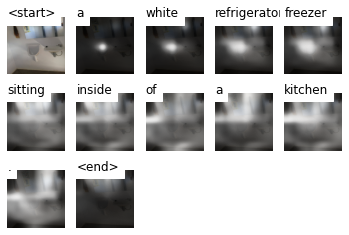

In [21]:
beam_size=5
for i,img_path in enumerate(img_paths):
    
    filename='./results/og_{}.png'.format(i)
    # Caption Images
    seq, alphas = caption(filename,encoder, decoder, img_path, word2idx, beam_size)
    alphas = torch.FloatTensor(alphas)

    # Visualize Attention
    filename='./results/res_{}.png'.format(i)
    atten(img_path, seq, alphas, idx2word,filename, True)